#Lab 4: FIR filters and envelopes

The goal of this lab is to learn how to implement FIR filters in Python, and how we can use them to improve our synthesis.

In [ ]:
!git clone https://github.com/pzinemanas/sis1lab.git

import os
import numpy as np
import librosa
import IPython.display as ipd
from scipy import signal
import matplotlib.pyplot as plt

from sis1lab.util import load_audio, plot_signals, plot_spectrogram, plot_mean_spectrogram

Cloning into 'sis1lab'...
remote: Enumerating objects: 59, done.
remote: Counting objects: 100% (59/59), done.
remote: Compressing objects: 100% (43/43), done.
remote: Total 59 (delta 16), reused 28 (delta 6), pack-reused 0
Unpacking objects: 100% (59/59), done.


**1. Overview of Filtering**

Filtering, particularly FIR (Finite Impulse Response) filtering, is a method used in signal processing to modify or extract certain components of a signal.

In this context, an FIR filter is a discrete-time system that processes an input signal $$x[n]$$ o produce an output signal $$y[n]$$ It does this by performing a weighted summation of past values of the input signal:

$$
y[n] = \sum_{k=0}^M b_kx[n-k]
$$

Here, $$y[n]$$ represents the output at discrete time $$n$$, and the equation sums up products of past input values $$x[n−k]$$ with corresponding coefficients $$b_k$$ These coefficients determine how much influence each past input value has on the current output.

To implement FIR filters in Python, the np.convolve() function from NumPy is a versatile tool. It performs convolutions, which in the context of FIR filters, can calculate the output signal based on the filter's coefficients and the input signal.

For instance, the code you mentioned likely demonstrates how to implement a simple three-point averaging system using np.convolve(). This system could be a basic filter that averages each value with its immediate neighboring values to smooth out fluctuations in the signal.



In [ ]:
fs = 1
x = [np.floor(x/10) for x in range(50)]
b = np.array([1.0/3, 1.0/3, 1.0/3])
y = np.convolve(b, x)

plot_signals([y,x], fs, name=['input x[n]', 'output y[n]'], mode='lines+markers')

In this graph, he input signal $$x[n]$$ is a step function, and the output signal $$y[n]$$ is the result of the convolution of $$x[n]$$ with the filter coefficients. The graph shows these two signals over time. The output signal is a smoothed version of the input signal, demonstrating the noise reduction capability of FIR filters

1.1 Explain the filtering action of the 5-point averager by comparing the plot of the input $x[n]$ and the output $y[n]$. This filter might be called a “smoothing” filter. Note how the transitions from one level to another have been “smoothed.”

A 5-point averager is a type of Finite Impulse Response (FIR) filter that averages the current and four previous input samples to produce each output sample. This filter is often referred to as a “smoothing” filter because it reduces the variation between adjacent samples, resulting in a smoother output signal.
When comparing the plot of the input $$x[n]$$ and the output $$y[n]$$, you would notice that the output signal follows the general trend of the input signal but with less abrupt changes. The transitions from one level to another in the input signal are “smoothed” in the output signal. This is because each output sample is an average of five input samples, which naturally reduces the impact of sudden changes in the input signal.
For example, if the input signal has a sudden jump from one level to another, this jump will be spread over five output samples in the output signal, resulting in a more gradual transition. Similarly, if the input signal has a sudden drop, this drop will also be spread over five output samples, again resulting in a more gradual transition.
This smoothing effect is particularly useful in applications where you want to reduce the impact of noise or other unwanted variations in the signal. However, it’s important to note that this smoothing comes at the cost of reduced sharpness in the signal’s features. For instance, sharp peaks in the input signal may be flattened in the output signal. This is a trade-off that needs to be considered when using smoothing filters like the 5-point averager.

1.2 Define a function `moving_average_filter(x, N)` which implements the N-points averaging filter.

In [ ]:
def averaging_filter(x, N):
  # write your code here
  y = np.convolve(x, [1/N]*N)
  return y

1.3 Run the example below using the `averaging_filter` instead. Change the number N and explain what happen.

In [ ]:
fs = 1
x = [np.floor(x/10) for x in range(50)]
y = averaging_filter(x, 5)

plot_signals([y,x], fs, name=['input x[n]', 'output y[n]'], mode='lines+markers')

1.4 How would you classify this filter, as a low-pass o high-pass filter?

low-pass filter.

The output signal y[n]its a smoothed version of the input signal x[n], which indicates that high-frequency components have been attenuated. This is a characteristic of low-pass filters, which allow low-frequency components to pass through while reducing the amplitude of frequencies higher than the cutoff frequency.

**2. Envelope detector**

Now we'll implement an envelope detector by concatenating two systems: a full-wave rectifier (absolute value) and the N-point averaging filter.

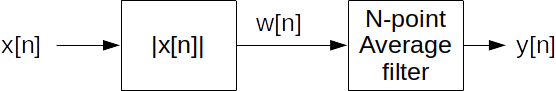

2.1 Define a function `envelope(x, N)` which applies an N-point averaging filter to the full-wave rectified signal and returns the output $y[n]$.

**Note 1**: to calculate the full-wave rectified signal check the `np.abs()` function.

**Note 2**: The output should have the same length as the input signal. Use 'same' mode (see [np.convolve](https://numpy.org/doc/stable/reference/generated/numpy.convolve.html) documentation).

In [ ]:
def envelope(x, N):
  y = np.convolve(np.abs(x), [1/N]*N, 'same')
  return y

2.2 Load your the reference signal and calculate its envelope using the function you designed. Plot the reference signal and envelope in the same figure.

In [ ]:
filepath = "./sis1lab/audio/reference.wav"
x, fs = load_audio(filepath)

env = envelope(x, 200)

plot_signals([x, np.abs(x), env], fs, t_start=0, t_end=0.5, name=['reference', 'absolute reference', 'envelope'])

ipd.Audio(x, rate=fs)

The envelope of a signal is a smooth curve that outlines its extremes. In this case, it is computed by taking the absolute value of the signal x and then applying a low-pass filter (as implemented by the envelope function).

Looking at the plot, we can see three signals:

The reference signal (blue) which is the original audio signal.
The absolute reference signal (orange) which is the absolute value of the audio signal.
The envelope (green) which is a smoothed version of the absolute reference signal.
The envelope signal follows the general trend of the absolute reference signal but with less high-frequency components, indicating that a low-pass filter has been applied.

2.3 Change the number N to get a good result. What happen when you change the number N?

Increasing N will result in more smoothing, as you’re averaging over a larger number of samples. This will reduce the high-frequency components even further, making the envelope follow the slower changes in the signal. However, it may also introduce more delay in the envelope tracking the changes in the signal.

Decreasing N will result in less smoothing, as you’re averaging over fewer samples. This will allow the envelope to track faster changes in the signal, but it may also let through more high-frequency components.

So, the choice of N depends on the specific requirements of your application. If you want to capture slow changes, use a larger N. If you want to track fast changes, use a smaller N.

2.4 Explain with your own words why this system achieves extracting the envelope. It might be useful to plot together the signals $x[n]$, $w[n]$ and $y[n]$.

The reason this system works for envelope extraction is that it effectively tracks the peak values of the signal over time, which is what we perceive as the envelope. The window size N determines how closely the envelope follows the signal. A larger N results in a smoother envelope that follows the slow changes in the signal, while a smaller N allows the envelope to track faster changes.



2.5 Now let's apply this envelope to the synthesized signal. Copy the code from Lab3 Ex. 2.1 and generate the synthesized signal. Then multiply the synthesized signal by the envelope. Note that both signal and envelope should have the same length. You can define a time vector of the same length of the envelope to create the signal:

In [ ]:
Ts = 1/float(fs)
t = np.arange(0, len(env)*Ts, Ts)
# Write your code here

def synthesize(f0, phi, Ak, t):
  y = 0
  for k in range(1, len(Ak) + 1):
    y += Ak[k-1] * np.cos(2*np.pi*k*f0*t + k*phi - (k-1)*np.pi/2)
  return y

weights = [1, 0.16, 0.093, 0.15, 0.05, 0.06, 0.013, 0.009, 0.02, 0.02, 0.011, 0.0054, 0.0026]

y = synthesize(196, 0, weights, t)

env = envelope(x, 200)
y = y*env
y = np.amax(x)*y/np.amax(y)

In [ ]:
plot_signals([x, y], fs, t_start=0, t_end=1.5, name=['original', 'synthetized'])

ipd.Audio(y, rate=fs)

2.5. Compare the spectrograms of the reference signal and the synthesized signal. What are the main differences?

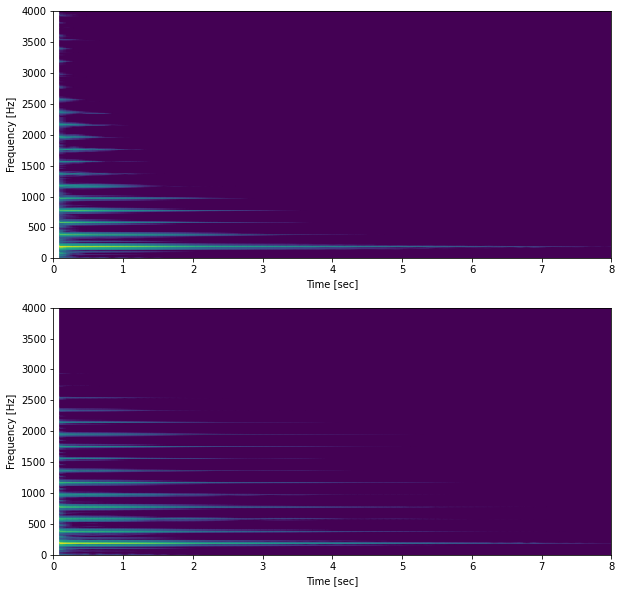

In [ ]:
hop_length = 4096
n_fft = 8192

ff, tt, S = signal.spectrogram(x, fs, nperseg=n_fft, noverlap=hop_length, nfft=n_fft)
ff, tt, Sy = signal.spectrogram(y, fs, nperseg=n_fft, noverlap=hop_length, nfft=n_fft)

plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plot_spectrogram(ff, tt, S)
plt.xlim([0,8])
plt.ylim([0,4000])

plt.subplot(2,1,2)
plot_spectrogram(ff, tt, Sy)
plt.xlim([0,8])
plt.ylim([0,4000])
plt.show()

The differences between the two spectrograms suggest that the synthesized sound may not have captured all the frequency components of the original sound, or it may have less energy at certain frequencies.